In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import datetime as dt


In [2]:
prices_df= pd.read_csv("price_input_file.csv")

In [3]:
electricity_demand_df=pd.read_csv("electricity_demand_input_file.csv")

In [4]:
heat_demand_df=pd.read_csv("heat_demand_input_file.csv")



In [5]:
weather_input_df=pd.read_csv("weather_input_file.csv")


In [6]:
prices_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8712 entries, 0 to 8711
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Time    8712 non-null   object 
 1   price   8712 non-null   float64
dtypes: float64(1), object(1)
memory usage: 136.3+ KB


In [7]:
electricity_demand_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35040 entries, 0 to 35039
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    35040 non-null  object 
 1   total_load  35040 non-null  float64
dtypes: float64(1), object(1)
memory usage: 547.6+ KB


In [8]:
heat_demand_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Tijd    8760 non-null   object 
 1   load    8760 non-null   float64
dtypes: float64(1), object(1)
memory usage: 137.0+ KB


In [9]:
weather_input_df.head()

,datetime,temperature,total_horizontal_irradiation,diffuse_horizontal_irradiation
0,2023-01-01 00:00,5.54,0.0,0.0
1,2023-01-01 00:15,5.54,0.0,0.0
2,2023-01-01 00:30,5.54,0.0,0.0
3,2023-01-01 00:45,5.54,0.0,0.0
4,2023-01-01 01:00,5.81,0.0,0.0


In [10]:
weather_input_df.describe()

,temperature,total_horizontal_irradiation,diffuse_horizontal_irradiation
count,35040.000000,35040.000000,35040.000000
mean,10.607105,120.409817,67.923288
std,6.712032,193.073326,99.388152
min,-8.700000,0.000000,0.000000
25%,5.447500,0.000000,0.000000
50%,10.595000,0.000000,0.000000
75%,15.520000,171.000000,112.000000
max,32.660000,922.000000,439.000000


In [11]:
weather_input_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35040 entries, 0 to 35039
Data columns (total 4 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   datetime                        35040 non-null  object 
 1   temperature                     35040 non-null  float64
 2   total_horizontal_irradiation    35040 non-null  float64
 3   diffuse_horizontal_irradiation  35040 non-null  float64
dtypes: float64(3), object(1)
memory usage: 1.1+ MB


In [12]:
##first let's seperate the date from the time and maybe merge all the tabels together !

prices_df['date_time']= pd.to_datetime(prices_df['Time'])



In [13]:
prices_df.sample(10)

,Time,price,date_time
4773,2023-07-19 03:00:00,325.0,2023-07-19 03:00:00
932,2023-02-08 22:00:00,177.0,2023-02-08 22:00:00
465,2023-01-20 09:00:00,236.0,2023-01-20 09:00:00
2190,2023-04-02 12:00:00,215.0,2023-04-02 12:00:00
8604,2023-12-27 12:00:00,145.0,2023-12-27 12:00:00
311,2023-01-13 23:00:00,190.0,2023-01-13 23:00:00
1254,2023-02-22 08:00:00,212.0,2023-02-22 08:00:00
3938,2023-06-14 08:00:00,205.0,2023-06-14 08:00:00
8197,2023-12-10 13:00:00,376.0,2023-12-10 13:00:00
2418,2023-04-12 00:00:00,186.0,2023-04-12 00:00:00


In [14]:
prices_df.drop(columns='Time', axis=1,inplace=True)

In [15]:
electricity_demand_df['date_time']= pd.to_datetime(electricity_demand_df['datetime'])
electricity_demand_df.drop(columns='datetime', axis=1,inplace=True)

In [16]:
electricity_demand_df.sample(10)

,total_load,date_time
5226,25773.274582,2023-02-24 10:30:00
10607,22561.601191,2023-04-21 11:45:00
27751,11600.531231,2023-10-17 01:45:00
31643,27077.992788,2023-11-26 14:45:00
24212,10223.534002,2023-09-10 05:00:00
25066,10200.928322,2023-09-19 02:30:00
6572,25266.466596,2023-03-10 11:00:00
11291,21001.979413,2023-04-28 14:45:00
27450,18210.810972,2023-10-13 22:30:00
34852,17246.663074,2023-12-30 01:00:00


In [17]:
heat_demand_df.sample(10)

,Tijd,load
5663,2023-08-25 00:00,6014.309807
4165,2023-06-23 14:00,5074.847400
7687,2023-11-17 08:00,101171.970700
7286,2023-10-31 15:00,49265.179780
5147,2023-08-03 12:00,30783.712450
4406,2023-07-03 15:00,14.537202
677,2023-01-29 06:00,164121.323200
6638,2023-10-04 15:00,35577.145190
5956,2023-09-06 05:00,5989.140783
2999,2023-05-06 00:00,6014.309807


In [18]:
heat_demand_df['date_time'] = pd.to_datetime(heat_demand_df['Tijd '])


In [19]:
heat_demand_df

,Tijd,load,date_time
0,2023-01-01 01:00,26367.38455,2023-01-01 01:00:00
1,2023-01-01 02:00,35285.62778,2023-01-01 02:00:00
2,2023-01-01 03:00,37859.64685,2023-01-01 03:00:00
3,2023-01-01 04:00,41412.06449,2023-01-01 04:00:00
4,2023-01-01 05:00,58173.40883,2023-01-01 05:00:00
...,...,...,...
8755,2023-12-31 20:00,230051.42320,2023-12-31 20:00:00
8756,2023-12-31 21:00,229787.76140,2023-12-31 21:00:00
8757,2023-12-31 22:00,216013.06730,2023-12-31 22:00:00
8758,2023-12-31 23:00,197838.93870,2023-12-31 23:00:00


In [20]:
heat_demand_df.drop(columns='Tijd ', axis=1 ,inplace= True)

In [21]:
heat_demand_df


,load,date_time
0,26367.38455,2023-01-01 01:00:00
1,35285.62778,2023-01-01 02:00:00
2,37859.64685,2023-01-01 03:00:00
3,41412.06449,2023-01-01 04:00:00
4,58173.40883,2023-01-01 05:00:00
...,...,...
8755,230051.42320,2023-12-31 20:00:00
8756,229787.76140,2023-12-31 21:00:00
8757,216013.06730,2023-12-31 22:00:00
8758,197838.93870,2023-12-31 23:00:00


In [22]:
weather_input_df.sample(10)

,datetime,temperature,total_horizontal_irradiation,diffuse_horizontal_irradiation
21894,2023-08-17 01:30,15.02,0.0,0.0
2952,2023-01-31 18:00,0.26,0.0,0.0
8444,2023-03-29 23:00,6.32,0.0,0.0
2685,2023-01-28 23:15,1.36,0.0,0.0
9579,2023-04-10 18:45,11.19,9.0,9.0
18515,2023-07-12 20:45,17.03,0.0,0.0
29221,2023-11-01 09:15,10.43,47.0,47.0
6237,2023-03-06 23:15,2.83,0.0,0.0
15744,2023-06-14 00:00,13.18,0.0,0.0
21076,2023-08-08 13:00,18.97,237.0,237.0


In [23]:
weather_input_df['date_time'] = pd.to_datetime(weather_input_df["datetime"])


In [24]:
weather_input_df.drop(columns='datetime', axis=1 ,inplace= True)

In [25]:
weather_input_df.sample(10)



,temperature,total_horizontal_irradiation,diffuse_horizontal_irradiation,date_time
7001,7.61,0.0,0.0,2023-03-14 22:15:00
4184,3.04,57.0,57.0,2023-02-13 14:00:00
1400,8.04,74.0,71.0,2023-01-15 14:00:00
21225,15.64,0.0,0.0,2023-08-10 02:15:00
8492,10.27,259.0,254.0,2023-03-30 11:00:00
25023,13.22,224.0,186.0,2023-09-18 15:45:00
28352,10.32,105.0,97.0,2023-10-23 08:00:00
5090,4.98,0.0,0.0,2023-02-23 00:30:00
8242,8.51,0.0,0.0,2023-03-27 20:30:00
12737,17.41,436.0,122.0,2023-05-13 16:15:00


In [26]:
#heat_demand_df
#electricity_demand_df
#weather_input_df
#prices_df

In [27]:
prices_df

,price,date_time
0,82.00,2023-01-01 00:00:00
1,67.10,2023-01-01 01:00:00
2,75.10,2023-01-01 02:00:00
3,50.90,2023-01-01 03:00:00
4,37.70,2023-01-01 04:00:00
...,...,...
8707,22.10,2023-12-31 19:00:00
8708,10.60,2023-12-31 20:00:00
8709,5.22,2023-12-31 21:00:00
8710,2.39,2023-12-31 22:00:00


In [28]:
#maybe Direct Normal Irradiance (DNI)  which is total_horizontal_irradiation - diffuse_horizontal_irradiation

In [29]:
from plotly.graph_objs import Scatter
from sklearn.ensemble import IsolationForest


In [30]:
model = IsolationForest()
model.fit(prices_df["price"].values.reshape(-1, 1))



IsolationForest()

In [31]:




# from plotly.graph_objs import Figure, Scatter

# anomaly_scores = model.decision_function(prices_df["price"].values.reshape(-1, 1))

# # Create time series with anomaly highlights
# trace_normal = Scatter(x=prices_df["date_time"], y=prices_df["price"], mode='lines', name='Normal')

# colorscale = [[0, 'white'], [0.5, 'lightcoral'], [1, 'red']]

# trace_anomaly = Scatter(x=prices_df["date_time"], y=prices_df["price"], mode='markers', name='Anomaly',
#                         marker=dict(size=10, color=abs(anomaly_scores), colorscale=colorscale))

# fig = Figure(data=[trace_normal, trace_anomaly])
# fig.show()



In [32]:
fig = px.box(prices_df, y="price",  
             title="Box Plot of Target Column")
fig.show()


In [33]:
prices_df[prices_df["price"] >552].count()/len(prices_df) *100

price        2.789256
date_time    2.789256
dtype: float64

In [34]:
prices_df[prices_df["price"] >552]

,price,date_time
1588,564.0,2023-03-08 06:00:00
1589,690.0,2023-03-08 07:00:00
1590,650.0,2023-03-08 08:00:00
1599,603.0,2023-03-08 17:00:00
1600,675.0,2023-03-08 18:00:00
...,...,...
8290,565.0,2023-12-14 10:00:00
8291,568.0,2023-12-14 11:00:00
8297,590.0,2023-12-14 17:00:00
8298,557.0,2023-12-14 18:00:00


In [35]:
electricity_demand_df

,total_load,date_time
0,21288.974883,2023-01-01 00:00:00
1,20846.755644,2023-01-01 00:15:00
2,20423.362531,2023-01-01 00:30:00
3,19982.660015,2023-01-01 00:45:00
4,19648.179153,2023-01-01 01:00:00
...,...,...
35035,23745.668666,2023-12-31 22:45:00
35036,22966.381829,2023-12-31 23:00:00
35037,22575.265223,2023-12-31 23:15:00
35038,22183.614503,2023-12-31 23:30:00


In [36]:
fig = px.box(electricity_demand_df, y="total_load",  
             title="Box Plot of Target Column")
fig.show()


In [37]:
#heat
fig = px.box(heat_demand_df, y="load",  
             title="Box Plot of Target Column")
fig.show()


In [38]:
heat_demand_df[heat_demand_df["load"] > 204000]

,load,date_time
5,222582.1628,2023-01-01 06:00:00
6,213943.6228,2023-01-01 07:00:00
8,247513.0208,2023-01-01 09:00:00
9,278131.4715,2023-01-01 10:00:00
10,257038.2437,2023-01-01 11:00:00
...,...,...
8752,210607.2961,2023-12-31 17:00:00
8754,234027.6922,2023-12-31 19:00:00
8755,230051.4232,2023-12-31 20:00:00
8756,229787.7614,2023-12-31 21:00:00


In [39]:
#weather_input_df
fig = px.box(weather_input_df, y="total_horizontal_irradiation",  
             title="Box Plot of Target Column")
fig.show()


In [40]:
weather_input_df.describe()

,temperature,total_horizontal_irradiation,diffuse_horizontal_irradiation,date_time
count,35040.000000,35040.000000,35040.000000,35040
mean,10.607105,120.409817,67.923288,2023-07-02 11:52:30
min,-8.700000,0.000000,0.000000,2023-01-01 00:00:00
25%,5.447500,0.000000,0.000000,2023-04-02 05:56:15
50%,10.595000,0.000000,0.000000,2023-07-02 11:52:30
75%,15.520000,171.000000,112.000000,2023-10-01 17:48:45
max,32.660000,922.000000,439.000000,2023-12-31 23:45:00
std,6.712032,193.073326,99.388152,NaN


# EDA


In [41]:
merged_data = pd.merge(electricity_demand_df, weather_input_df, on='date_time')
merged_data

,total_load,date_time,temperature,total_horizontal_irradiation,diffuse_horizontal_irradiation
0,21288.974883,2023-01-01 00:00:00,5.54,0.0,0.0
1,20846.755644,2023-01-01 00:15:00,5.54,0.0,0.0
2,20423.362531,2023-01-01 00:30:00,5.54,0.0,0.0
3,19982.660015,2023-01-01 00:45:00,5.54,0.0,0.0
4,19648.179153,2023-01-01 01:00:00,5.81,0.0,0.0
...,...,...,...,...,...
35035,23745.668666,2023-12-31 22:45:00,4.98,0.0,0.0
35036,22966.381829,2023-12-31 23:00:00,5.26,0.0,0.0
35037,22575.265223,2023-12-31 23:15:00,5.26,0.0,0.0
35038,22183.614503,2023-12-31 23:30:00,5.26,0.0,0.0


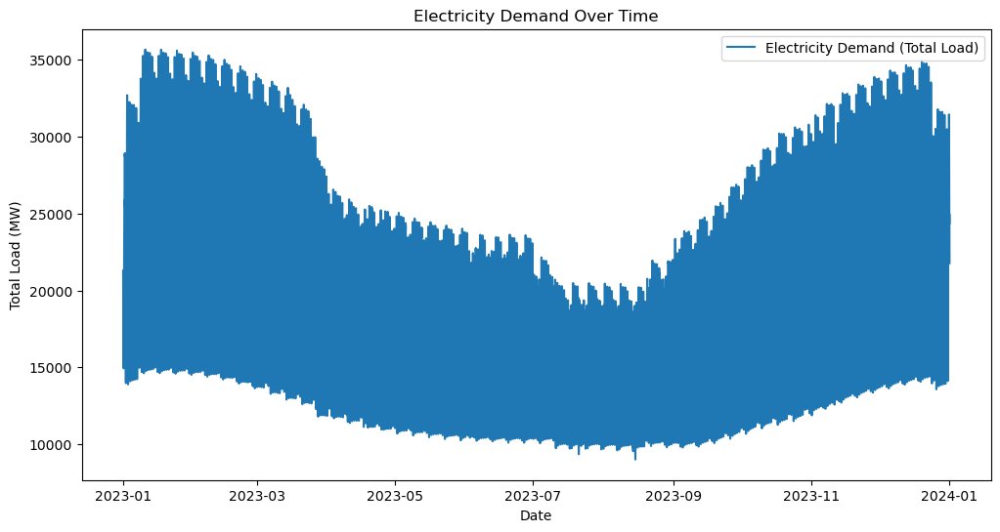

In [42]:
plt.figure(figsize=(12, 6))
plt.plot(merged_data['date_time'], merged_data['total_load'], label='Electricity Demand (Total Load)')
plt.xlabel('Date')
plt.ylabel('Total Load (MW)')
plt.title('Electricity Demand Over Time')
plt.legend()
plt.show()

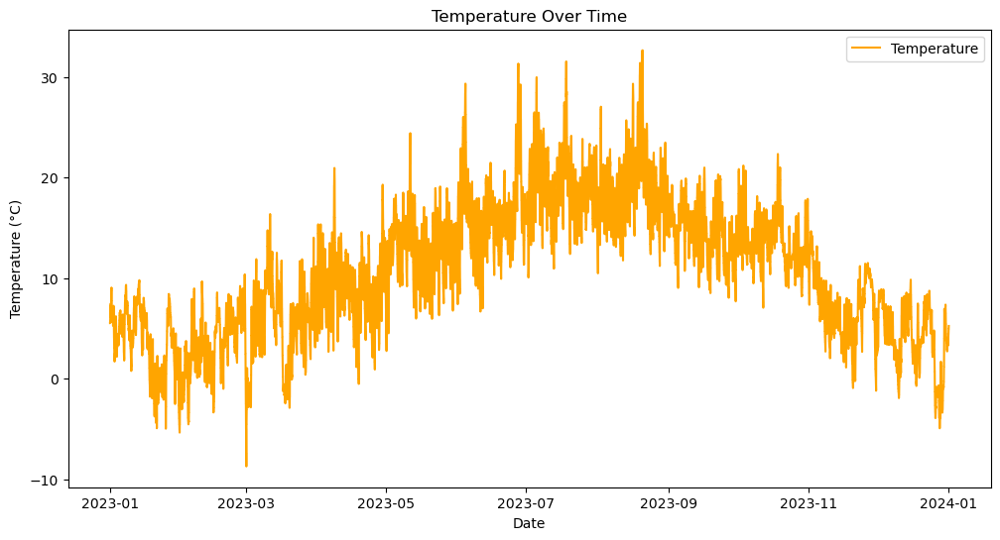

In [43]:
plt.figure(figsize=(12, 6))
plt.plot(merged_data['date_time'], merged_data['temperature'], label='Temperature', color='orange')
plt.xlabel('Date')
plt.ylabel('Temperature (°C)')
plt.title('Temperature Over Time')
plt.legend()
plt.show()

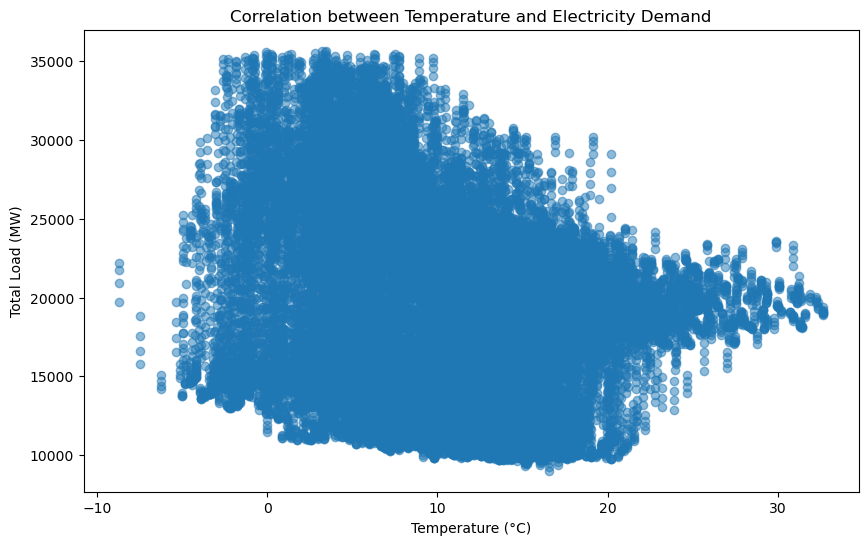

In [44]:
plt.figure(figsize=(10, 6))
plt.scatter(merged_data['temperature'], merged_data['total_load'], alpha=0.5)
plt.xlabel('Temperature (°C)')
plt.ylabel('Total Load (MW)')
plt.title('Correlation between Temperature and Electricity Demand')
plt.show()

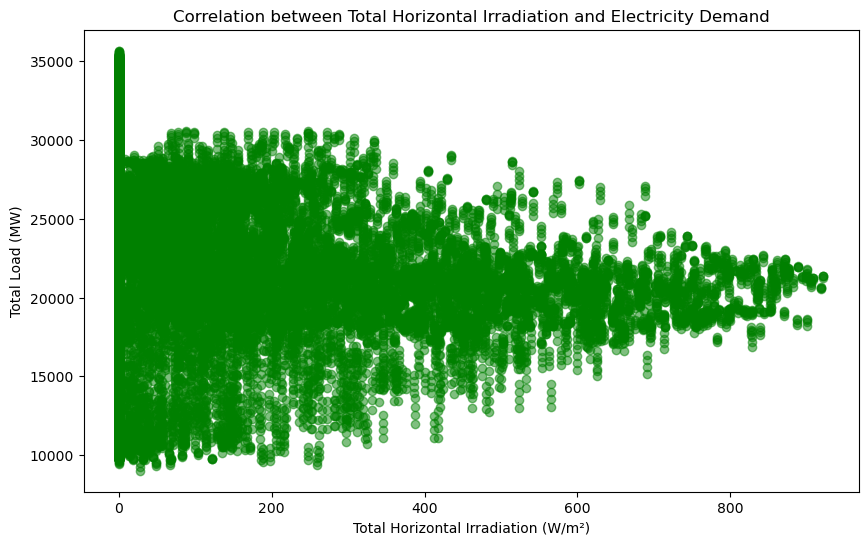

In [45]:
# Scatter plot to visualize correlation between total horizontal irradiation and electricity demand

plt.figure(figsize=(10, 6))
plt.scatter(merged_data['total_horizontal_irradiation'], merged_data['total_load'], alpha=0.5, color='green')
plt.xlabel('Total Horizontal Irradiation (W/m²)')
plt.ylabel('Total Load (MW)')
plt.title('Correlation between Total Horizontal Irradiation and Electricity Demand')
plt.show()


In [46]:
# It appears that higher irradiation might be associated with lower electricity demand,
# possibly due to increased solar energy generation reducing the need for other electricity sources.

In [47]:
heat_demand_merged = pd.merge(heat_demand_df, weather_input_df,on='date_time')
heat_demand_merged 

,load,date_time,temperature,total_horizontal_irradiation,diffuse_horizontal_irradiation
0,26367.38455,2023-01-01 01:00:00,5.81,0.0,0.0
1,35285.62778,2023-01-01 02:00:00,6.09,0.0,0.0
2,37859.64685,2023-01-01 03:00:00,6.37,0.0,0.0
3,41412.06449,2023-01-01 04:00:00,6.65,0.0,0.0
4,58173.40883,2023-01-01 05:00:00,6.93,0.0,0.0
...,...,...,...,...,...
8754,234027.69220,2023-12-31 19:00:00,4.14,0.0,0.0
8755,230051.42320,2023-12-31 20:00:00,4.42,0.0,0.0
8756,229787.76140,2023-12-31 21:00:00,4.70,0.0,0.0
8757,216013.06730,2023-12-31 22:00:00,4.98,0.0,0.0


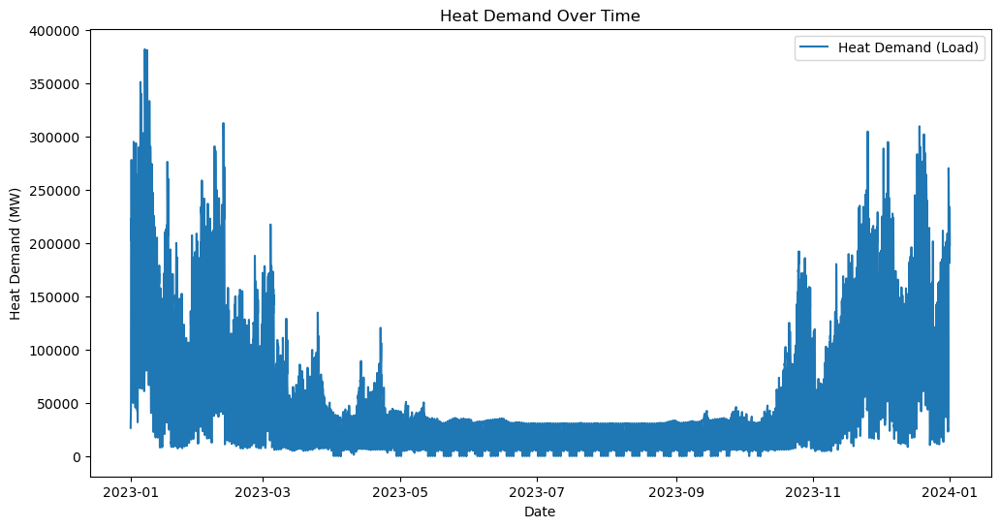

In [48]:

# Plot heat demand over time
plt.figure(figsize=(12, 6))
plt.plot(heat_demand_merged['date_time'], heat_demand_merged['load'], label='Heat Demand (Load)')
plt.xlabel('Date')
plt.ylabel('Heat Demand (MW)')
plt.title('Heat Demand Over Time')
plt.legend()
plt.show()

# Peaks in heat demand could be related to colder periods.


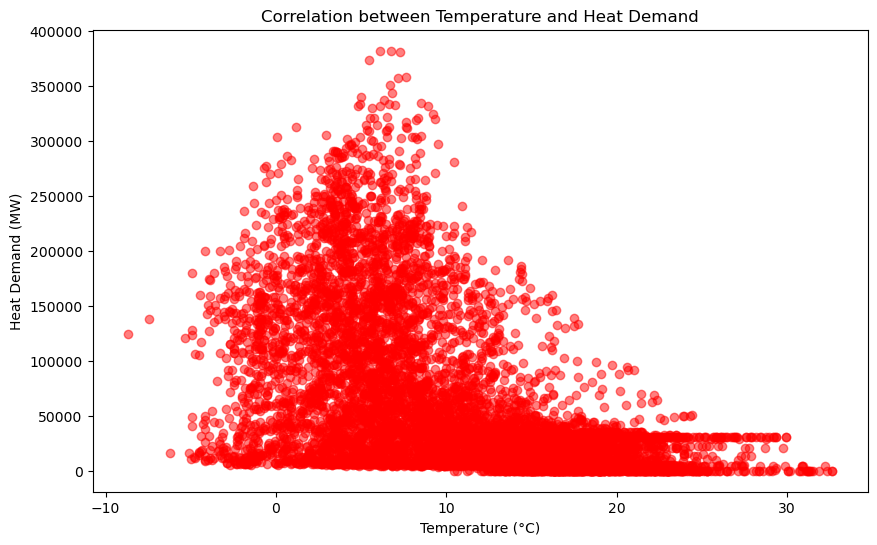

In [49]:
# Scatter plot to visualize correlation between temperature and heat demand
plt.figure(figsize=(10, 6))
plt.scatter(heat_demand_merged['temperature'], heat_demand_merged['load'], alpha=0.5, color='red')
plt.xlabel('Temperature (°C)')
plt.ylabel('Heat Demand (MW)')
plt.title('Correlation between Temperature and Heat Demand')
plt.show()


In [50]:
electricity_price_merged = pd.merge(electricity_demand_df, prices_df, on='date_time')
electricity_price_merged

,total_load,date_time,price
0,21288.974883,2023-01-01 00:00:00,82.00
1,19648.179153,2023-01-01 01:00:00,67.10
2,17831.871958,2023-01-01 02:00:00,75.10
3,16226.512637,2023-01-01 03:00:00,50.90
4,15279.764157,2023-01-01 04:00:00,37.70
...,...,...,...
8707,30472.101342,2023-12-31 19:00:00,22.10
8708,28027.510381,2023-12-31 20:00:00,10.60
8709,25819.939134,2023-12-31 21:00:00,5.22
8710,24966.263403,2023-12-31 22:00:00,2.39


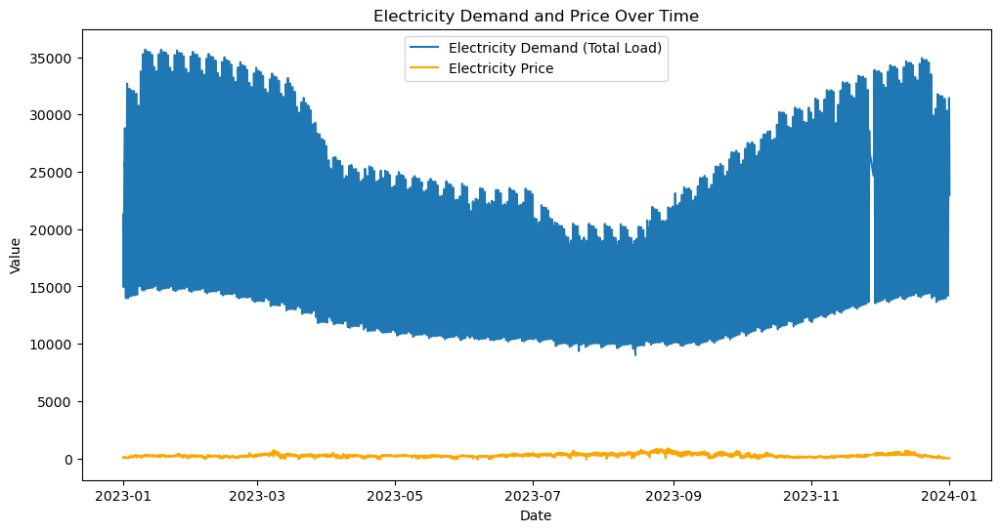

In [51]:
plt.figure(figsize=(12, 6))
plt.plot(electricity_price_merged['date_time'], electricity_price_merged['total_load'], label='Electricity Demand (Total Load)')
plt.plot(electricity_price_merged['date_time'], electricity_price_merged['price'], label='Electricity Price', color='orange')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Electricity Demand and Price Over Time')
plt.legend()
plt.show()

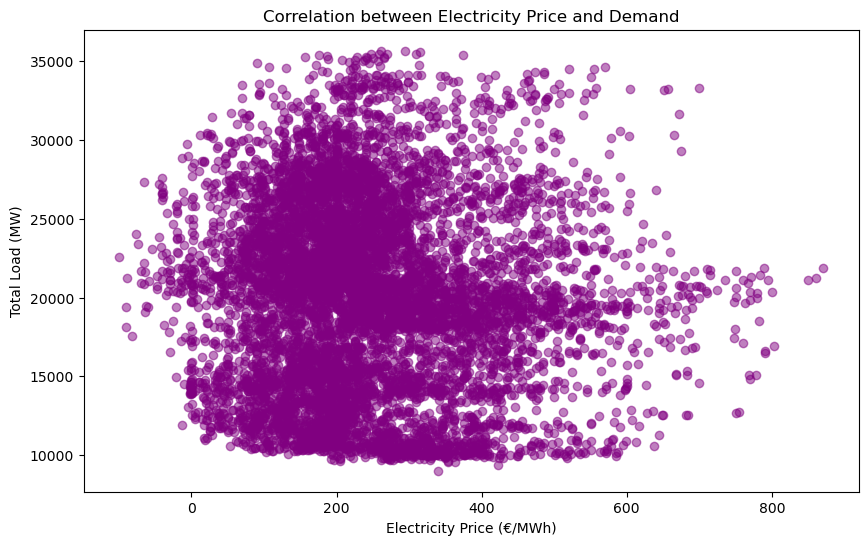

In [52]:
plt.figure(figsize=(10, 6))
plt.scatter(electricity_price_merged['price'], electricity_price_merged['total_load'], alpha=0.5, color='purple')
plt.xlabel('Electricity Price (€/MWh)')
plt.ylabel('Total Load (MW)')
plt.title('Correlation between Electricity Price and Demand')
plt.show()

In [53]:
electricity_price_weather_merged = pd.merge(electricity_price_merged, weather_input_df, on='date_time')
electricity_price_weather_merged

,total_load,date_time,price,temperature,total_horizontal_irradiation,diffuse_horizontal_irradiation
0,21288.974883,2023-01-01 00:00:00,82.00,5.54,0.0,0.0
1,19648.179153,2023-01-01 01:00:00,67.10,5.81,0.0,0.0
2,17831.871958,2023-01-01 02:00:00,75.10,6.09,0.0,0.0
3,16226.512637,2023-01-01 03:00:00,50.90,6.37,0.0,0.0
4,15279.764157,2023-01-01 04:00:00,37.70,6.65,0.0,0.0
...,...,...,...,...,...,...
8707,30472.101342,2023-12-31 19:00:00,22.10,4.14,0.0,0.0
8708,28027.510381,2023-12-31 20:00:00,10.60,4.42,0.0,0.0
8709,25819.939134,2023-12-31 21:00:00,5.22,4.70,0.0,0.0
8710,24966.263403,2023-12-31 22:00:00,2.39,4.98,0.0,0.0


In [54]:
correlation_matrix = electricity_price_weather_merged[['total_load', 'temperature', 'price']].corr()

correlation_matrix

,total_load,temperature,price
total_load,1.000000,-0.236817,-0.025307
temperature,-0.236817,1.000000,0.299211
price,-0.025307,0.299211,1.000000


In [55]:
import statsmodels.api as sm

X = electricity_price_weather_merged[['temperature', 'price']]
y = electricity_price_weather_merged['total_load']

X = sm.add_constant(X)

model = sm.OLS(y, X).fit()

regression_results = model.summary()

regression_results


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             total_load   R-squared:                       0.058
Model:                            OLS   Adj. R-squared:                  0.058
Method:                 Least Squares   F-statistic:                     269.9
Date:                Tue, 04 Jun 2024   Prob (F-statistic):          1.90e-114
Time:                        12:16:56   Log-Likelihood:                -87802.
No. Observations:                8712   AIC:                         1.756e+05
Df Residuals:                    8709   BIC:                         1.756e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        2.182e+04    144.470    151.002      0.000    2.15e+04    2.21e+04
temperature  -222.4494      9.628    -23.105      0.000    -241.322    -203.577
price           2.2034      0.480      4.591      0.000       1.263       3.144
==============================================================================
Omnibus:                     1660.972   Durbin-Watson:                   0.104
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              347.537
Skew:                          -0.081   Prob(JB):                     3.41e-76
Kurtosis:                       2.035   Cond. No.                         654.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [56]:
#R-squared value: 0.058, model explains only about 5.8% of the variability in electricity demand.


In [57]:
electricity_heat_price_weather_merged =pd.merge(electricity_price_weather_merged, heat_demand_df, on='date_time')



In [58]:
electricity_heat_price_weather_merged['month'] = electricity_heat_price_weather_merged['date_time'].dt.month
electricity_heat_price_weather_merged




,total_load,date_time,price,temperature,total_horizontal_irradiation,diffuse_horizontal_irradiation,load,month
0,19648.179153,2023-01-01 01:00:00,67.10,5.81,0.0,0.0,26367.38455,1
1,17831.871958,2023-01-01 02:00:00,75.10,6.09,0.0,0.0,35285.62778,1
2,16226.512637,2023-01-01 03:00:00,50.90,6.37,0.0,0.0,37859.64685,1
3,15279.764157,2023-01-01 04:00:00,37.70,6.65,0.0,0.0,41412.06449,1
4,14986.582972,2023-01-01 05:00:00,39.70,6.93,0.0,0.0,58173.40883,1
...,...,...,...,...,...,...,...,...
8706,30472.101342,2023-12-31 19:00:00,22.10,4.14,0.0,0.0,234027.69220,12
8707,28027.510381,2023-12-31 20:00:00,10.60,4.42,0.0,0.0,230051.42320,12
8708,25819.939134,2023-12-31 21:00:00,5.22,4.70,0.0,0.0,229787.76140,12
8709,24966.263403,2023-12-31 22:00:00,2.39,4.98,0.0,0.0,216013.06730,12


In [67]:
electricity_heat_price_weather_merged2 = electricity_heat_price_weather_merged.copy()

In [63]:
electricity_demand_df 

,total_load,date_time
0,21288.974883,2023-01-01 00:00:00
1,20846.755644,2023-01-01 00:15:00
2,20423.362531,2023-01-01 00:30:00
3,19982.660015,2023-01-01 00:45:00
4,19648.179153,2023-01-01 01:00:00
...,...,...
35035,23745.668666,2023-12-31 22:45:00
35036,22966.381829,2023-12-31 23:00:00
35037,22575.265223,2023-12-31 23:15:00
35038,22183.614503,2023-12-31 23:30:00


# Time series Analysis

In [65]:

daily_electricity = electricity_demand_df.resample("D")["total_load"].sum()

plt.figure(figsize=(12, 6))
plt.plot(daily_electricity.index, daily_electricity.values, label="Electricity Demand")
plt.xlabel("Date")
plt.ylabel("Electricity Load (kWh)")
plt.title("Daily Electricity Demand")
plt.grid(True)
plt.legend()
plt.show()



TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'RangeIndex'

In [68]:
electricity_price_merged


,total_load,date_time,price
0,21288.974883,2023-01-01 00:00:00,82.00
1,19648.179153,2023-01-01 01:00:00,67.10
2,17831.871958,2023-01-01 02:00:00,75.10
3,16226.512637,2023-01-01 03:00:00,50.90
4,15279.764157,2023-01-01 04:00:00,37.70
...,...,...,...
8707,30472.101342,2023-12-31 19:00:00,22.10
8708,28027.510381,2023-12-31 20:00:00,10.60
8709,25819.939134,2023-12-31 21:00:00,5.22
8710,24966.263403,2023-12-31 22:00:00,2.39


In [72]:
electricity_price_merged2= electricity_price_merged.copy()

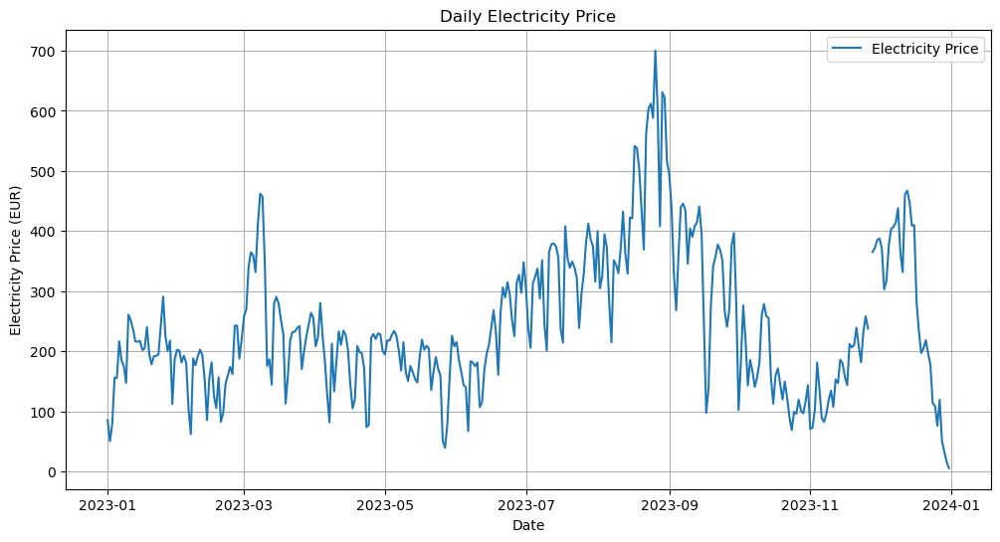

In [70]:


electricity_price_merged2.set_index("date_time", inplace=True)

daily_electricity_price = electricity_price_merged2.resample("D")["price"].mean()

plt.figure(figsize=(12, 6))
plt.plot(daily_electricity_price.index, daily_electricity_price.values, label="Electricity Price")
plt.xlabel("Date")
plt.ylabel("Electricity Price (EUR)") 
plt.title("Daily Electricity Price")
plt.grid(True)
plt.legend()
plt.show()




In [73]:
electricity_price_merged2= electricity_price_merged.copy()

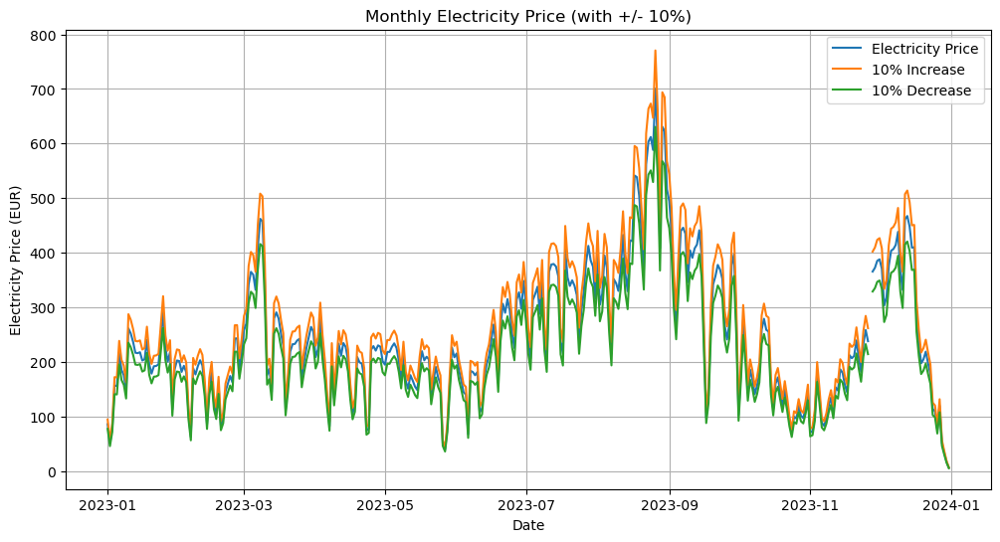

In [74]:
electricity_price_merged2.set_index("date_time", inplace=True)

daily_electricity_price = electricity_price_merged2.resample("D")["price"].mean()

# Calculate 10% more and 10% less prices
price_increase = daily_electricity_price * 1.1
price_decrease = daily_electricity_price * 0.9

plt.figure(figsize=(12, 6))

plt.plot(daily_electricity_price.index, daily_electricity_price.values, label="Electricity Price")
plt.plot(daily_electricity_price.index, price_increase.values, label="10% Increase")
plt.plot(daily_electricity_price.index, price_decrease.values, label="10% Decrease")

plt.xlabel("Date")
plt.ylabel("Electricity Price (EUR)") 
plt.title("Monthly Electricity Price (with +/- 10%)")
plt.grid(True)
plt.legend()
plt.show()




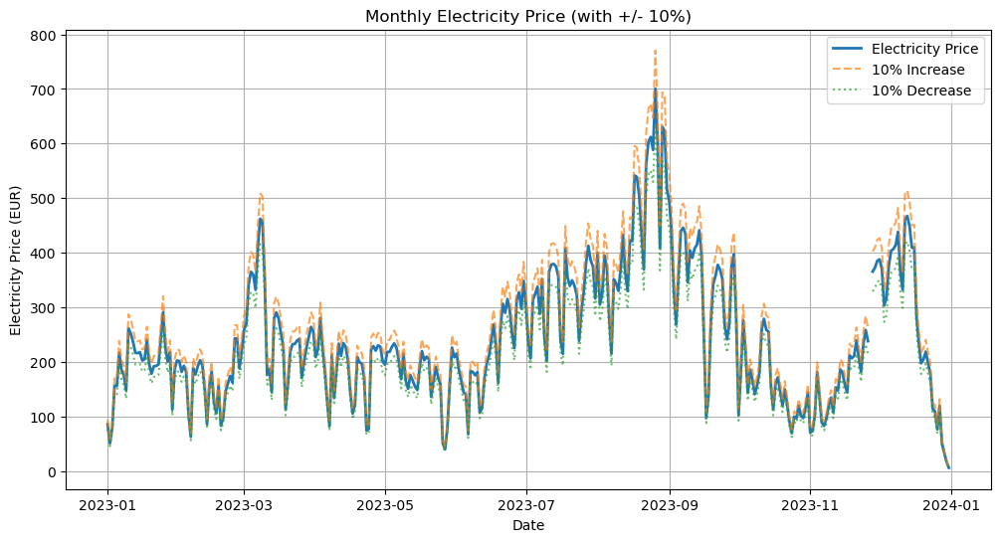

In [75]:




plt.figure(figsize=(12, 6))

plt.plot(daily_electricity_price.index, daily_electricity_price.values, label="Electricity Price", linewidth=2)
plt.plot(
    daily_electricity_price.index,
    price_increase.values,
    label="10% Increase",
    linestyle="--",
    alpha=0.7,  
)
plt.plot(
    daily_electricity_price.index,
    price_decrease.values,
    label="10% Decrease",
    linestyle=":",
    alpha=0.7,
)

plt.xlabel("Date")
plt.ylabel("Electricity Price (EUR)") 
plt.title("Monthly Electricity Price (with +/- 10%)")
plt.grid(True)
plt.legend()
plt.show()


plt.show()


In [77]:
electricity_price_merged2= electricity_price_merged.copy()

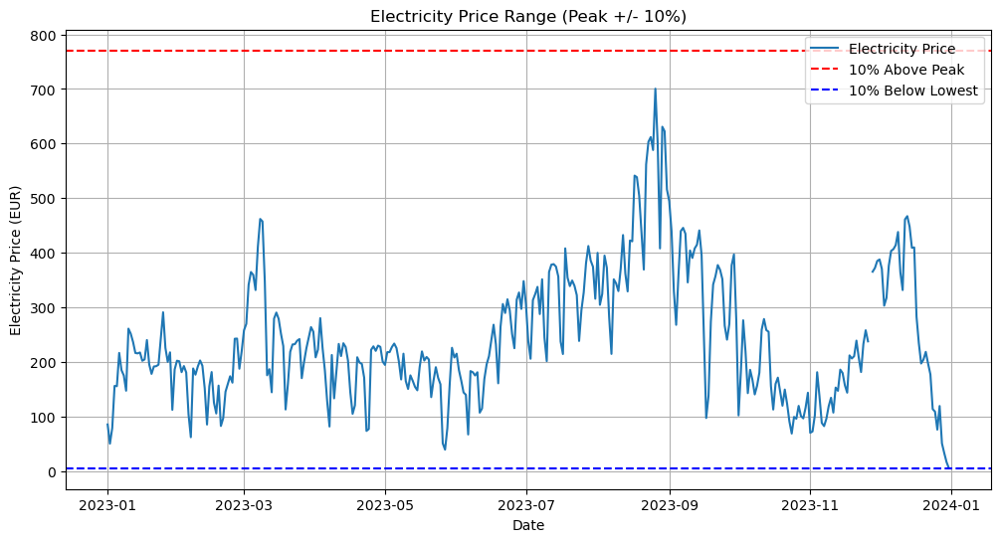

In [78]:
electricity_price_merged2.set_index("date_time", inplace=True)

daily_electricity_price = electricity_price_merged2.resample("D")["price"].mean()

# Find peak and lowest prices
peak_price = daily_electricity_price.max()
lowest_price = daily_electricity_price.min()

# Calculate 10% buffers
peak_price_buffer = peak_price * 1.1
lowest_price_buffer = lowest_price * 0.9

plt.figure(figsize=(12, 6))

plt.plot(daily_electricity_price.index, daily_electricity_price.values, label="Electricity Price")
plt.axhline(y=peak_price_buffer, color="red", linestyle="--", label="10% Above Peak")
plt.axhline(y=lowest_price_buffer, color="blue", linestyle="--", label="10% Below Lowest")

plt.xlabel("Date")
plt.ylabel("Electricity Price (EUR)")
plt.title("Electricity Price Range (Peak +/- 10%)")
plt.grid(True)
plt.legend()
plt.show()


In [80]:
electricity_price_merged2= electricity_price_merged.copy()

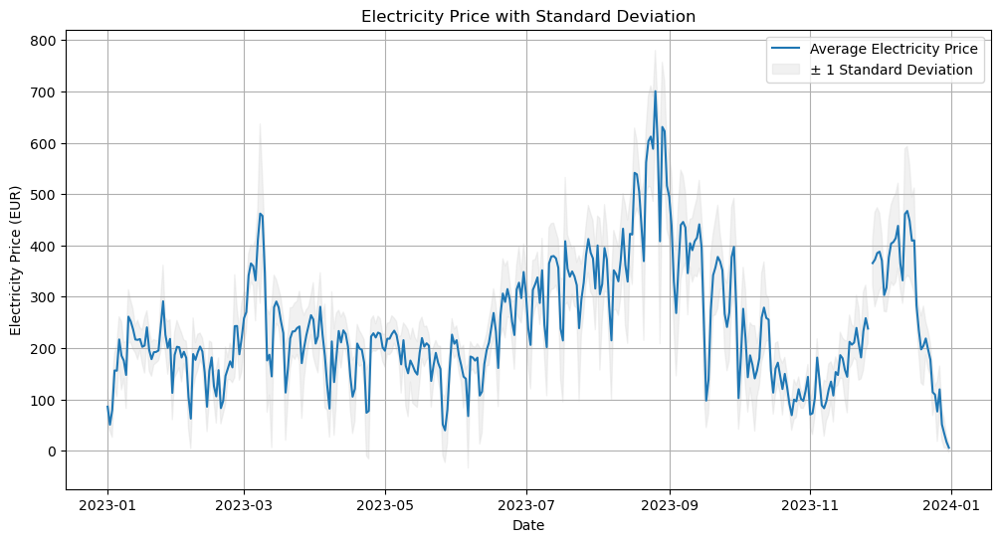

In [81]:
electricity_price_merged2.set_index("date_time", inplace=True)

daily_electricity_price = electricity_price_merged2.resample("D")["price"].mean()
daily_electricity_std = electricity_price_merged2.resample("D")["price"].std()  # Standard deviation

plt.figure(figsize=(12, 6))

# Plot average price with shaded area (1 standard deviation)
plt.plot(
    daily_electricity_price.index,
    daily_electricity_price.values,
    label="Average Electricity Price",
)
plt.fill_between(
    daily_electricity_price.index,
    daily_electricity_price.values - daily_electricity_std,
    daily_electricity_price.values + daily_electricity_std,
    color="lightgrey",
    alpha=0.3,
    label="± 1 Standard Deviation",
)

# Identify peaks and lowest prices (optional)
# ... (code to find peaks and lowest prices)

# Plot them as markers on the graph (optional)
# plt.scatter(peak_dates, peak_prices, color="red", marker="^", label="Peaks")
# plt.scatter(low_dates, low_prices, color="blue", marker="v", label="Lowest Prices")

plt.xlabel("Date")
plt.ylabel("Electricity Price (EUR)")
plt.title("Electricity Price with Standard Deviation")
plt.grid(True)
plt.legend()
plt.show()


In [97]:
electricity_price_merged2.describe()

,total_load,date_time,price
count,8712.000000,8712,8712.000000
mean,19992.394357,2023-07-01 20:14:49.256198400,244.688409
min,9010.469117,2023-01-01 00:00:00,-100.000000
25%,14972.511355,2023-04-01 23:45:00,158.000000
50%,20182.802775,2023-07-01 17:30:00,220.000000
75%,24182.236739,2023-09-30 11:15:00,315.250000
max,35669.885440,2023-12-31 23:00:00,871.000000
std,5939.754902,NaN,134.869379


In [103]:
electricity_price_merged2= electricity_price_merged.copy()

In [ ]:
electricity_price_merged2.set_index("date_time", inplace=True)


In [ ]:

def identify_peaks_and_lows(data, window=7, std_multiplier=1):

  smoothed_data = data.rolling(window=window).mean()
  std = data.rolling(window=window).std()
  upper_bound = smoothed_data + (std_multiplier * std)
  lower_bound = smoothed_data - (std_multiplier * std)

  is_peak = (data > upper_bound) & (data.diff() > 0)
  peak_price = data[is_peak]

  is_low = (data < lower_bound) & (data.diff() < 0)
  low_price = data[is_low]

  return pd.DataFrame({
      'original_price': data,
      'is_peak': is_peak,
      'peak_price': peak_price,
      'is_low': is_low,
      'low_price': low_price,
      'increased_peak_price': data[is_peak] * 1.1,
      'decreased_low_price': data[is_low] * 0.9,
  })

electricity_price_with_peaks_lows = identify_peaks_and_lows(electricity_price_merged2["price"])  


#saving
electricity_price_with_peaks_lows.to_csv("electricity_price_merged2_with_peaks_lows.csv", index=True)

print("Electricity price data with identified peaks and lows and adjusted prices saved to 'electricity_price_merged2_with_peaks_lows.csv'")



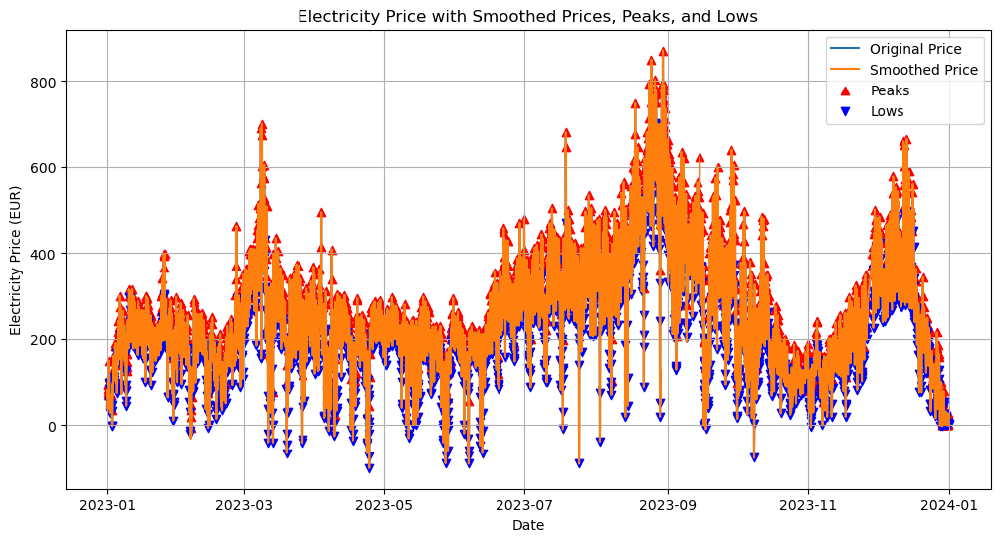

Electricity price data with identified peaks, lows, and adjusted prices saved to 'electricity_price_merged2_with_peaks_lows.csv'


In [105]:

# plt.figure(figsize=(12, 6))
# plt.plot(electricity_price_merged2.index, electricity_price_merged2["price"], label="Original Price")
# plt.plot(electricity_price_merged2.index, electricity_price_with_peaks_lows["original_price"], label="Smoothed Price")
# plt.scatter(electricity_price_with_peaks_lows[electricity_price_with_peaks_lows["is_peak"]].index, electricity_price_with_peaks_lows[electricity_price_with_peaks_lows["is_peak"]]["peak_price"], marker='^', color='red', label='Peaks')
# plt.scatter(electricity_price_with_peaks_lows[electricity_price_with_peaks_lows["is_low"]].index, electricity_price_with_peaks_lows[electricity_price_with_peaks_lows["is_low"]]["low_price"], marker='v', color='blue', label='Lows')
# plt.xlabel("Date")
# plt.ylabel("Electricity Price (EUR)")
# plt.title("Electricity Price with Smoothed Prices, Peaks, and Lows")
# plt.legend()
# plt.grid(True)
# plt.show()




In [222]:
electricity_price_with_peaks_lows.sample(10)

,original_price,is_peak,peak_price,is_low,low_price,increased_peak_price,decreased_low_price
date_time,,,,,,,
2023-11-14 13:00:00,189.0,False,NaN,False,NaN,NaN,NaN
2023-05-25 05:00:00,178.0,False,NaN,False,NaN,NaN,NaN
2023-10-06 06:00:00,213.0,True,213.0,False,NaN,234.3,NaN
2023-06-20 13:00:00,223.0,False,NaN,False,NaN,NaN,NaN
2023-02-19 03:00:00,53.3,False,NaN,True,53.3,NaN,47.97
2023-11-21 03:00:00,147.0,False,NaN,True,147.0,NaN,132.30
2023-11-18 00:00:00,167.0,False,NaN,False,NaN,NaN,NaN
2023-03-11 03:00:00,174.0,False,NaN,True,174.0,NaN,156.60
2023-08-12 15:00:00,350.0,False,NaN,False,NaN,NaN,NaN


In [102]:
new_df= pd.read_csv("electricity_price_merged2_with_peaks_lows.csv")

In [219]:
new_df.sample(10)

,original_price,increased_peak_price,decreased_low_price
date_time,,,
2023-07-23 06:00:00,337.0,NaN,NaN
2023-06-18 19:00:00,328.0,360.8,NaN
2023-07-24 14:00:00,-82.0,NaN,NaN
2023-03-20 06:00:00,170.0,NaN,NaN
2023-05-14 00:00:00,171.0,NaN,NaN
2023-07-29 06:00:00,463.0,NaN,NaN
2023-12-04 22:00:00,296.0,NaN,NaN
2023-06-08 01:00:00,169.0,NaN,NaN
2023-01-20 15:00:00,183.0,NaN,NaN


In [107]:
new_df.drop(columns=["is_peak","peak_price","is_low","low_price"],inplace=True)

In [108]:
new_df.to_csv("new_df.csv", index=True)


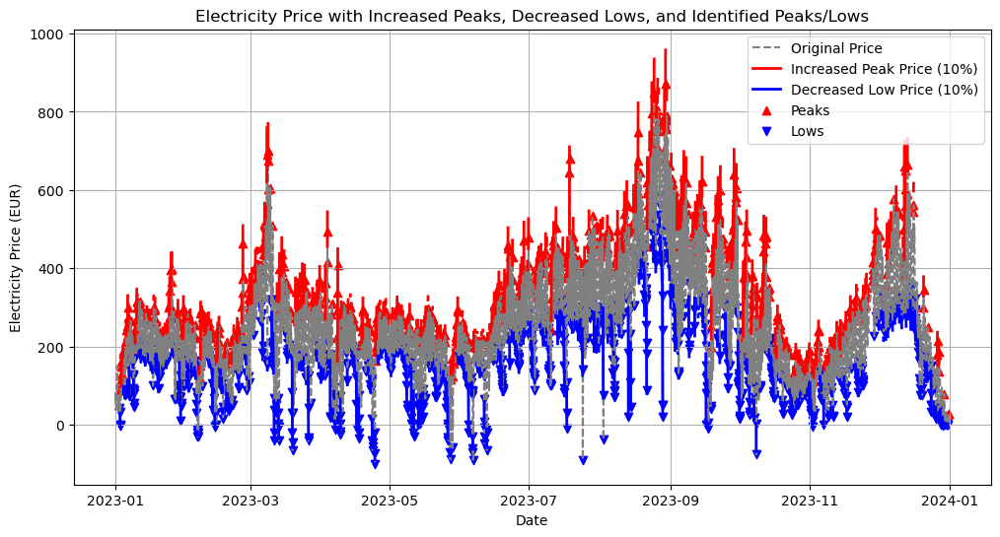

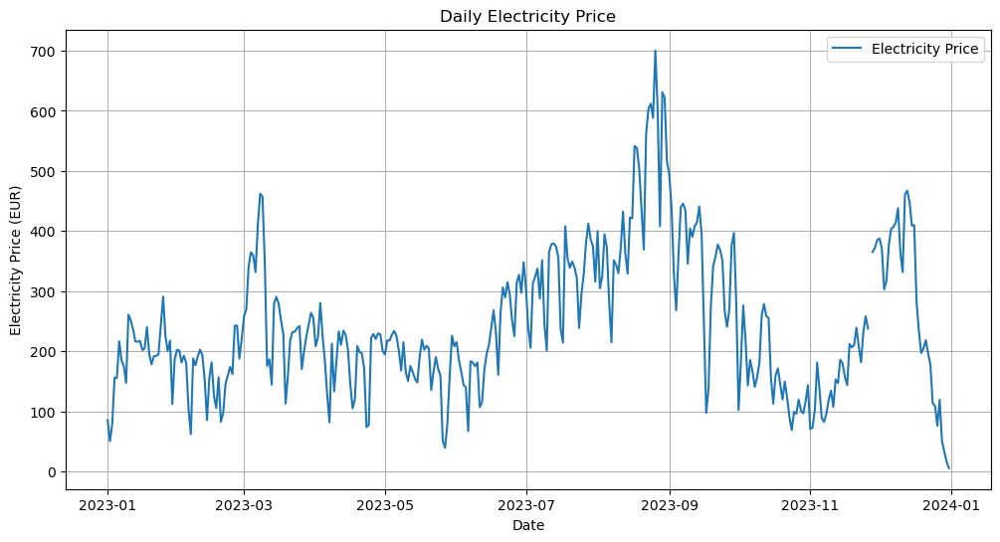

In [116]:
def identify_peaks_and_lows(data, window=30, std_multiplier=1):

  smoothed_data = data.rolling(window=window).mean()
  std = data.rolling(window=window).std()
  upper_bound = smoothed_data + (std_multiplier * std)
  lower_bound = smoothed_data - (std_multiplier * std)

  is_peak = (data > upper_bound) & (data.diff() > 0)
  peak_price = data[is_peak]

  is_low = (data < lower_bound) & (data.diff() < 0)
  low_price = data[is_low]

  return pd.DataFrame({
      'original_price': data,
      'is_peak': is_peak,
      'peak_price': peak_price,
      'is_low': is_low,
      'low_price': low_price,
      'increased_peak_price': data[is_peak] * 1.1,
      'decreased_low_price': data[is_low] * 0.9,
  })

electricity_price_with_peaks_lows = identify_peaks_and_lows(electricity_price_merged2["price"])  


# Plot for detailed price changes
plt.figure(figsize=(12, 6))
plt.plot(electricity_price_merged2.index, electricity_price_merged2["price"], label="Original Price", linestyle='--', color='gray')
plt.plot(electricity_price_with_peaks_lows.index, electricity_price_with_peaks_lows["increased_peak_price"], label="Increased Peak Price (10%)", linewidth=2, color='red')
plt.plot(electricity_price_with_peaks_lows.index, electricity_price_with_peaks_lows["decreased_low_price"], label="Decreased Low Price (10%)", linewidth=2, color='blue')
plt.scatter(electricity_price_with_peaks_lows[electricity_price_with_peaks_lows["is_peak"]].index, electricity_price_with_peaks_lows[electricity_price_with_peaks_lows["is_peak"]]["peak_price"], marker='^', color='red', label='Peaks')
plt.scatter(electricity_price_with_peaks_lows[electricity_price_with_peaks_lows["is_low"]].index, electricity_price_with_peaks_lows[electricity_price_with_peaks_lows["is_low"]]["low_price"], marker='v', color='blue', label='Lows')
plt.xlabel("Date")
plt.ylabel("Electricity Price (EUR)")
plt.title("Electricity Price with Increased Peaks, Decreased Lows, and Identified Peaks/Lows")
plt.legend()
plt.grid(True)

# Daily Electricity Price Plot (added below)
plt.figure(figsize=(12, 6))
daily_electricity_price = electricity_price_merged2.resample("D")["price"].mean()
plt.plot(daily_electricity_price.index, daily_electricity_price.values, label="Electricity Price")
plt.xlabel("Date")
plt.ylabel("Electricity Price (EUR)")
plt.title("Daily Electricity Price")
plt.grid(True)
plt.legend()
plt.show()


In [119]:
electricity_price_with_peaks_lows.sample(10)

,original_price,is_peak,peak_price,is_low,low_price,increased_peak_price,decreased_low_price
date_time,,,,,,,
2023-02-25 19:00:00,463.0,True,463.0,False,NaN,509.3,NaN
2023-03-03 03:00:00,307.0,False,NaN,False,NaN,NaN,NaN
2023-09-19 19:00:00,442.0,True,442.0,False,NaN,486.2,NaN
2023-06-05 17:00:00,150.0,False,NaN,False,NaN,NaN,NaN
2023-02-08 16:00:00,193.0,False,NaN,False,NaN,NaN,NaN
2023-04-26 09:00:00,266.0,False,NaN,False,NaN,NaN,NaN
2023-06-29 21:00:00,367.0,False,NaN,False,NaN,NaN,NaN
2023-05-22 07:00:00,167.0,False,NaN,False,NaN,NaN,NaN
2023-04-11 11:00:00,191.0,False,NaN,False,NaN,NaN,NaN


In [145]:
new_df.head()

,date_time,original_price,increased_peak_price,decreased_low_price
0,2023-01-01 00:00:00,82.0,82.0,82.0
1,2023-01-01 01:00:00,67.1,67.1,67.1
2,2023-01-01 02:00:00,75.1,75.1,75.1
3,2023-01-01 03:00:00,50.9,50.9,50.9
4,2023-01-01 04:00:00,37.7,37.7,37.7


In [172]:
df_new = electricity_price_with_peaks_lows.copy()
df_new



,original_price,is_peak,peak_price,is_low,low_price,increased_peak_price,decreased_low_price
date_time,,,,,,,
2023-01-01 00:00:00,82.00,False,NaN,False,NaN,NaN,NaN
2023-01-01 01:00:00,67.10,False,NaN,False,NaN,NaN,NaN
2023-01-01 02:00:00,75.10,False,NaN,False,NaN,NaN,NaN
2023-01-01 03:00:00,50.90,False,NaN,False,NaN,NaN,NaN
2023-01-01 04:00:00,37.70,False,NaN,False,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2023-12-31 19:00:00,22.10,False,NaN,False,NaN,NaN,NaN
2023-12-31 20:00:00,10.60,False,NaN,False,NaN,NaN,NaN
2023-12-31 21:00:00,5.22,False,NaN,False,NaN,NaN,NaN


In [176]:
df_new.drop(columns=['is_peak','peak_price','is_low','low_price'],inplace=True)

In [177]:
df_new.sample(10)



,original_price,increased_peak_price,decreased_low_price
date_time,,,
2023-03-28 04:00:00,195.0,NaN,NaN
2023-09-02 19:00:00,597.0,656.7,NaN
2023-03-24 23:00:00,235.0,NaN,NaN
2023-11-21 07:00:00,285.0,313.5,NaN
2023-12-26 02:00:00,31.0,NaN,27.9
2023-06-14 07:00:00,228.0,250.8,NaN
2023-04-08 21:00:00,259.0,NaN,NaN
2023-10-14 16:00:00,259.0,NaN,NaN
2023-09-15 17:00:00,330.0,NaN,297.0


In [162]:

df_new.update({'increased_peak_price': df_new['original_price'].where(df_new['increased_peak_price'].isna(), df_new['increased_peak_price']),
              'decreased_low_price': df_new['original_price'].where(df_new['decreased_low_price'].isna(), df_new['decreased_low_price'])})

# Print the modified DataFrame (optional)
print(df_new)


                     original_price  increased_peak_price  decreased_low_price
date_time                                                                     
2023-01-01 00:00:00           82.00                 82.00                82.00
2023-01-01 01:00:00           67.10                 67.10                67.10
2023-01-01 02:00:00           75.10                 75.10                75.10
2023-01-01 03:00:00           50.90                 50.90                50.90
2023-01-01 04:00:00           37.70                 37.70                37.70
...                             ...                   ...                  ...
2023-12-31 19:00:00           22.10                 22.10                22.10
2023-12-31 20:00:00           10.60                 10.60                10.60
2023-12-31 21:00:00            5.22                  5.22                 5.22
2023-12-31 22:00:00            2.39                  2.39                 2.39
2023-12-31 23:00:00            0.13                 

In [185]:
df_new.update({'increased_peak_price':df_new['original_price'].where(df_new['increased_peak_price'].isna(),df_new['increased_peak_price']),
              'decreased_low_price':df_new['original_price'].where(df_new['decreased_low_price'].isna(),df_new['decreased_low_price'])})

# Print the modified sample
print( df_new)


                     original_price  increased_peak_price  decreased_low_price
date_time                                                                     
2023-01-01 00:00:00           82.00                 82.00                82.00
2023-01-01 01:00:00           67.10                 67.10                67.10
2023-01-01 02:00:00           75.10                 75.10                75.10
2023-01-01 03:00:00           50.90                 50.90                50.90
2023-01-01 04:00:00           37.70                 37.70                37.70
...                             ...                   ...                  ...
2023-12-31 19:00:00           22.10                 22.10                22.10
2023-12-31 20:00:00           10.60                 10.60                10.60
2023-12-31 21:00:00            5.22                  5.22                 5.22
2023-12-31 22:00:00            2.39                  2.39                 2.39
2023-12-31 23:00:00            0.13                 

In [186]:
df_new.sample(10)



,original_price,increased_peak_price,decreased_low_price
date_time,,,
2023-06-16 09:00:00,252.0,252.0,252.0
2023-03-09 05:00:00,440.0,440.0,440.0
2023-07-10 21:00:00,378.0,415.8,378.0
2023-01-19 15:00:00,205.0,205.0,205.0
2023-04-10 23:00:00,224.0,224.0,224.0
2023-10-06 17:00:00,121.0,121.0,121.0
2023-01-18 01:00:00,203.0,203.0,203.0
2023-02-28 03:00:00,168.0,168.0,168.0
2023-09-05 03:00:00,223.0,223.0,223.0


In [199]:
decreased_low_price=df_new.copy()

In [200]:
decreased_low_price.drop(columns=["original_price","increased_peak_price"], inplace=True)

In [201]:
decreased_low_price.to_csv("decreased_low_price.csv", index=True)

In [205]:
df_new_original_price

,original_price
date_time,
2023-01-01 00:00:00,82.00
2023-01-01 01:00:00,67.10
2023-01-01 02:00:00,75.10
2023-01-01 03:00:00,50.90
2023-01-01 04:00:00,37.70
...,...
2023-12-31 19:00:00,22.10
2023-12-31 20:00:00,10.60
2023-12-31 21:00:00,5.22


In [206]:
df_new_increased_peak_price

,increased_peak_price
date_time,
2023-01-01 00:00:00,82.00
2023-01-01 01:00:00,67.10
2023-01-01 02:00:00,75.10
2023-01-01 03:00:00,50.90
2023-01-01 04:00:00,37.70
...,...
2023-12-31 19:00:00,22.10
2023-12-31 20:00:00,10.60
2023-12-31 21:00:00,5.22


In [207]:
decreased_low_price

,decreased_low_price
date_time,
2023-01-01 00:00:00,82.00
2023-01-01 01:00:00,67.10
2023-01-01 02:00:00,75.10
2023-01-01 03:00:00,50.90
2023-01-01 04:00:00,37.70
...,...
2023-12-31 19:00:00,22.10
2023-12-31 20:00:00,10.60
2023-12-31 21:00:00,5.22


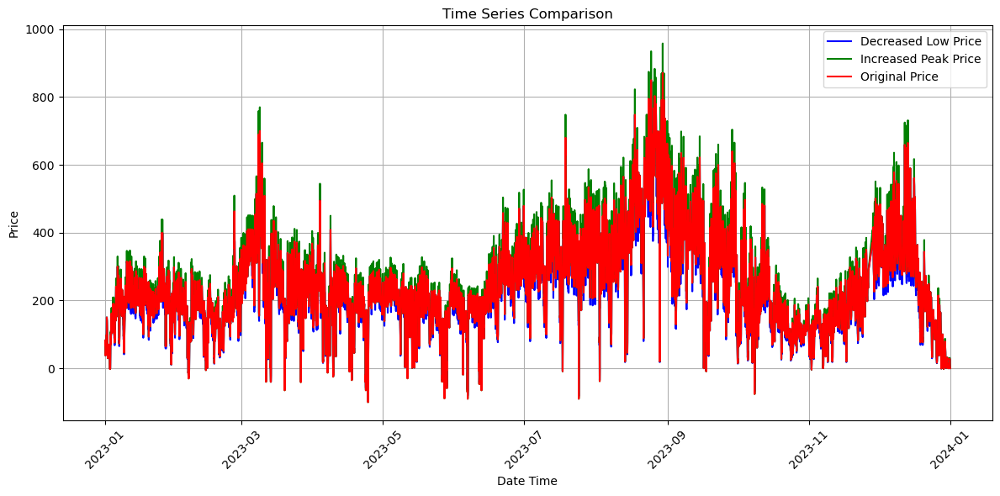

In [210]:
plt.figure(figsize=(12, 6))  

plt.plot(decreased_low_price, label='Decreased Low Price', color='blue')
plt.plot(df_new_increased_peak_price, label='Increased Peak Price', color='green')
plt.plot(df_new_original_price, label='Original Price', color='red')

# Customize the plot
plt.xlabel('Date Time')
plt.ylabel('Price')
plt.title('Time Series Comparison')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)  

plt.tight_layout()
plt.show()




In [212]:

combined_df = pd.concat([df_new_original_price, df_new_increased_peak_price, decreased_low_price], axis=1, join='outer')
combined_df.columns = ['Original Price', 'Increased Peak Price', 'Decreased Low Price']

fig = px.line(combined_df, x=combined_df.index, y=combined_df.columns)

fig.update_layout(
    title='Electricity Price with Original, Increased Peaks, and Decreased Lows',
    xaxis_title='Date',
    yaxis_title='Electricity Price (EUR)',
    legend_title_text='Price Type',
    legend_title_font_size=14,
    legend_title_font_color='black'
)

fig.update_traces(
    line_width=2,
    marker={'size': 6}  
)

fig.for_each_trace(lambda trace: trace.update(name=trace.name.capitalize())) 

fig.show()


In [218]:

combined_df = pd.concat([df_new_original_price, df_new_increased_peak_price, decreased_low_price], axis=1, join='outer')
combined_df.columns = ['Original Price', 'Increased Peak Price', 'Decreased Low Price']

fig = px.line(combined_df, x=combined_df.index, y=combined_df.columns)

# Customize the plot for better visualization
fig.update_layout(
    title='Electricity Price with Original, Increased Peaks, and Decreased Lows',
    xaxis_title='Date',
    yaxis_title='Electricity Price (EUR)',
    legend_title_text='Price Type',
    legend_title_font_size=14,
    legend_title_font_color='black'
)

# Customize line styles and colors
fig.update_traces(
    line_width=2,
    marker={'size': 6}  
)

fig.for_each_trace(lambda trace: trace.update(name=trace.name.capitalize())) 

fig.show()


In [223]:

def identify_peaks_and_lows(data, window=30, std_multiplier=1):

  smoothed_data = data.rolling(window=window).mean()
  std = data.rolling(window=window).std()
  upper_bound = smoothed_data + (std_multiplier * std)
  lower_bound = smoothed_data - (std_multiplier * std)

  is_peak = (data > upper_bound) & (data.diff() > 0)
  peak_price = data[is_peak]

  is_low = (data < lower_bound) & (data.diff() < 0)
  low_price = data[is_low]

  return pd.DataFrame({
      'original_price': data,
      'is_peak': is_peak,
      'peak_price': peak_price,
      'is_low': is_low,
      'low_price': low_price,
      'increased_peak_price': data[is_peak] * 1.5,
      'decreased_low_price': data[is_low] * 0.5,
  })

electricity_price_with_peaks_lows_trial = identify_peaks_and_lows(electricity_price_merged2["price"])  


#saving
electricity_price_with_peaks_lows_trial.to_csv("electricity_price_with_peaks_lows_trial.csv", index=True)




In [229]:
new_trial=pd.read_csv("df_new_original_price.csv")
new_trial["original_price"]=new_trial["original_price"] *2
new_trial.to_csv("new_trial.csv", index=True)
new_trial.head()



,date_time,original_price
0,2023-01-01 00:00:00,164.0
1,2023-01-01 01:00:00,134.2
2,2023-01-01 02:00:00,150.2
3,2023-01-01 03:00:00,101.8
4,2023-01-01 04:00:00,75.4


# Clustering Analysis


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans


In [ ]:
electricity_demand_df

In [ ]:

electricity_demand_df.reset_index(inplace=True)


In [ ]:
electricity_demand_df2=electricity_demand_df.copy()

In [ ]:
electricity_demand_df2['hour'] = electricity_demand_df2['date_time'].dt.hour


In [ ]:
clustering_data = electricity_demand_df2[['hour', 'total_load']]


In [ ]:
# Standardize the data
scaler = StandardScaler()
clustering_data_scaled = scaler.fit_transform(clustering_data)

In [ ]:
kmeans = KMeans(n_clusters=3, random_state=0)


In [ ]:
electricity_demand_df2['cluster'] = kmeans.fit_predict(clustering_data_scaled)
electricity_demand_df2['cluster']

In [ ]:
plt.figure(figsize=(12, 6))
plt.scatter(electricity_demand_df2['hour'], electricity_demand_df2['total_load'], c=electricity_demand_df2['cluster'], cmap='viridis', alpha=0.6)
plt.xlabel('Hour of the Day')
plt.ylabel('Total Load (MW)')
plt.title('K-means Clustering of Electricity Demand')
plt.colorbar(label='Cluster')
plt.show()

In [ ]:
"""Cluster 0 (Green): Low demand periods, typically early morning or late night.
Cluster 1 (Yellow): Medium demand periods, transitioning periods like early morning or late evening.
Cluster 2 (Purple): High demand periods, typically during peak hours."""

# extended regression analysis

In [ ]:
electricity_price_weather_merged['day_of_week'] = electricity_price_weather_merged['date_time'].dt.dayofweek
electricity_price_weather_merged['hour'] = electricity_price_weather_merged['date_time'].dt.hour


In [ ]:
# Prepare the data for regression
X_extended = electricity_price_weather_merged[['temperature', 'price', 'day_of_week', 'hour']]
y_extended = electricity_price_weather_merged['total_load']

In [ ]:
# dummifications of cat
X_extended = pd.get_dummies(X_extended, columns=['day_of_week', 'hour'], drop_first=True)

X_extended = sm.add_constant(X_extended)


In [ ]:
X_extended = X_extended.astype(float)


In [ ]:
model_extended = sm.OLS(y_extended, X_extended).fit()


In [ ]:

extended_regression_results = model_extended.summary()

extended_regression_results

#88.3% of the variability in electricity demand is explained by this model

#Interpretations:

-For each degree Celsius decrease in temperature, electricity demand increases by approximately 401 MW.

-For each unit increase in price, electricity demand decreases by approximately 0.473 MW.





# Check for Multicollinearity and Apply Regularization Techniques

In [ ]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a new DataFrame for the VIF data
vif_data = pd.DataFrame()
vif_data["feature"] = X_extended.columns

# Calculate VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_extended.values, i) for i in range(X_extended.shape[1])]

# Display the VIF data
print(vif_data)


# Apply Ridge and Lasso Regression to mitigate the multicollinearity effects.

In [ ]:
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

X_train, X_test, y_train, y_test = train_test_split(X_extended, y_extended, test_size=0.2, random_state=42)

ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_train, y_train)

y_pred_ridge = ridge_model.predict(X_test)
ridge_mse = mean_squared_error(y_test, y_pred_ridge)
ridge_r2 = r2_score(y_test, y_pred_ridge)

ridge_mse, ridge_r2

In [ ]:
# Fit Lasso regression model
lasso_model = Lasso(alpha=0.1)
lasso_model.fit(X_train, y_train)

# Predict and evaluate Lasso regression model
y_pred_lasso = lasso_model.predict(X_test)
lasso_mse = mean_squared_error(y_test, y_pred_lasso)
lasso_r2 = r2_score(y_test, y_pred_lasso)

lasso_mse, lasso_r2


# Time Series Modeling with ARIMA


In [ ]:
# from statsmodels.tsa.arima.model import ARIMA

# electricity_demand_df.set_index('date_time', inplace=True)

# # Fit ARIMA model (simple example with parameters p=5, d=1, q=0)
# arima_model = ARIMA(electricity_demand_df['total_load'], order=(5, 1, 0))
# arima_result = arima_model.fit()

# # Display the ARIMA model summary
# arima_summary = arima_result.summary()
# arima_summary


In [ ]:
'''AR Coefficients: All autoregressive terms are statistically significant, 
indicating that past values of electricity demand are useful for predicting current demand.'''

''''Model Fit: The low AIC, BIC, and HQIC values suggest a good model fit.'''


In [ ]:
# # Code to Analyze Residuals

# import matplotlib.pyplot as plt
# import statsmodels.api as sm

# # Get residuals from the ARIMA model
# residuals = arima_result.resid

# # Plot residuals
# plt.figure(figsize=(10, 6))
# plt.plot(residuals)
# plt.title('Residuals from ARIMA Model')
# plt.show()

# # Plot ACF and PACF of residuals
# fig, ax = plt.subplots(1, 2, figsize=(16, 6))
# sm.graphics.tsa.plot_acf(residuals, lags=40, ax=ax[0])
# sm.graphics.tsa.plot_pacf(residuals, lags=40, ax=ax[1])
# plt.show()


In [ ]:
# #Code to Check for Normality
# # Plot histogram of residuals
# plt.figure(figsize=(10, 6))
# plt.hist(residuals, bins=30, edgecolor='k')
# plt.title('Histogram of Residuals')
# plt.show()

# # Perform Shapiro-Wilk test for normality
# from scipy.stats import shapiro
# shapiro_test = shapiro(residuals)
# shapiro_test


In [ ]:
# initial_data = electricity_demand_df.head(10)
# initial_data
